# Travaux pratiques - mise en oeuvre de méthodes de prévisions pour les séries temporelles avec algorithmes de gradient boosting

## Déroulement du TP

Ces travaux vous proposent de mettre en oeuvre des techniques de prévision par régression sur de ses valeurs passées et des facteurs exogènes. Nous allons utiliser des algorithmes de gradient boosting.

### Développements requis

Des éléments de code vous sont fournis pour préparer les données requises et vous guider / simplifier certains points clés.
Vos développements de codes sont à exécuter de préférence dans un notebook Jupyter, mais vous pouvez aussi les faire dans des scripts Python.

Une proposition de corrigé complet reprenant chacune des sections de l'énoncé vous est donnée à la fin. N'hésitez pas à l'utiliser pour vous aider à avancer certains points bloquants.

Au préalable, vous devez installer les bibliothèques requises.

Si vous êtes familier du gestionnaire de dépendances moderne nommé `uv`, vous pouvez utiliser le fichier `pyproject.toml` fourni pour installer les dépendances avec la commande `uv sync`.
Un fichier `requirements.txt` est également disponible pour une installation avec `pip install -r requirements.txt`.

### Objectif du TP

Ce TP vise à mettre en oeuvre une chaine de traitements pour prévoir la consommation électrique à H+48 de la Bretagne à partir de données historiques et de facteurs exogènes (météo, vacances, températures prévues à 48h).

La préparation des données vous fournira une série temporelle de consommation. La météo prévisionnelle sera insérée dans les données. La température conditionne fortement la consommation de la Bretagne. Les données de vacances et fériés sont aussi des facteurs importants à prendre en compte, fournis dans les données

L'objectif est de construire un modèle de prévision de la consommation à l'aide d'algorithmes de gradient boosting, en utilisant les données historiques et les facteurs exogènes (météo) et les vacances scolaires.

Les étapes suivantes vous guideront à travers :

* de préparation de l'échantillon d'apprentissage,
* compréhension des séries temporelles et de leurs caractéristiques,
* construction d'un modèle de benchmark simple,
* de construction du modèle de gradient boosting et sa validation croisée,
* apprentissage du modèle et choix des hyperparamètres,
* d'évaluation des performances et comparaison à un benchmark simple,
* la mise en oeuvre d'élements d'explicabilité des modèles.


## Préparation de l'échantillon de données

L'ensemble des données vous est facilitée et fournie via une fonction `collecte_et_prepare_donnees_tp()` avec :
* la consommations électriques à l'heure de la région Bretagne (source RTE) depuis 2023 jusqu'à maintenant (données live) en MW,
* la météo prévisionnelle de température (source : open-meteo.com) à h+48 pour la Bretagne, sur la même historique et jusqu'à H+48 (données live),
* les vacances scolaires de la Bretagne pour la zone B (source : data.gouv.fr) sur la même période.

Les données commencent au 1er janvier 2023 et *sont mises à jour en continu* (à chaque exécution `collecte_et_prepare_donnees_tp`).

La prévision de consommation d'énergie est un cas très courant d'utilisation de séries temporelles avec des facteurs exogènes. Cesprévisions sont utiles (sur des échéances de 24h à 48h) pour la gestion de la production d'électricité, l'optimisation des réseaux, la planification de la maintenance et surtout aussi le trading d'électricité sur les marchés de gros de l'énergie.

Le chargement des données live est réalisé par : 

```python
from preparation_donnees_sources import collecte_et_prepare_donnees_tp
donnees_completes = collecte_et_prepare_donnees_tp()
```

Sans accès internet, vous pouvez aussi charger les données à partir du fichier `offline_data/integrated_data.parquet` fourni. Vous pouvez le faire avec la commande suivante :

```python
import pandas as pd
donnees_completes = pd.read_parquet("offline_data/integrated_data.parquet")
```

Vous obtenez, avec chacune des deux approches, un DataFrame avec les colonnes suivantes :

* `datetime` : la date et l'heure de la mesure (en index Pandas)
* `consommation_elec` : la consommation électrique à l'heure donnée (en MW)
* `temperature` : la température prévisionnelle à l'heure donnée (en °C)
* `vacances` : un indicateur binaire indiquant si l'heure donnée correspond à une période de vacances scolaires (1) ou non (0) en Bretagne.

Toutes les lignes de données nécessaires à la prévision, pour la consommation dans deux jours, sont présentes dans ce DataFrame. Logiquement la variable à prédire `consommation_elec` est disponible jusqu'à maintenant. On ne connait pas encore la consommation à venir, c'est l'objet du TP. Mais on connait les prévisions de température et les vacances scolaires jusqu'à H+48.

Pour faciliter le TP, le pas de temps a été régularisé (chaque 1 heure) sur l'ensemble de la période.


## Compréhension des séries temporelles et de leurs caractéristiques

* Proposez ici une visualisation de la série temporelle de consommation électrique, de la température et des vacances scolaires.
  
* Identifiez visuellement les saisonnalités et données manquantes, de préférence avec la bibliothèque `plotly`, très adaptée à l'exploration des données temporelles. Pour visualiser des séries temporelles avec de nombreux points interactivement, il est recommandé d'utiliser `go.Scattergl` de `import plotly.graph_objects as go` qui est optimisé pour les grandes séries.
  
* Evaluer les données manquantes (la série est régulière, chaque pas de temps est présent, mais les valeurs peuvent être manquantes). Que peut-on faire des données manquantes sachant la classe de modèles qu'on utilisera par la suite (méthode d'arbres) ?
  
* Vérfier les correlations entre les différentes variables (consommation, température, vacances) et leur évolution dans le temps. Quels relations semblent présentes ?
  
* Y-a-t-il de l'autocorrelation pour la variable d'interêt `consommation_elec` ? présentez des visualisations de l'autocorrelation (ACF) et de l'autocorrelation partielle (PACF) pour la variable `consommation_elec`. Quelles sont les implications de ces autocorrelations pour la construction du modèle de prévision à H+48 ?

## Construction des variables de prévision (features engineering)

* Pour construire un modèle de prévision à H+48, il est nécessaire de construire des variables de prévision (features) à partir des données historiques. Proposez une méthode pour construire ces variables à partir des données disponibles.
  
* Les variables prédictives souhaitées sont les suivantes :

  * `consommation_elec_h_minus_48` : la consommation électrique à l'heure précédente (H-48)
  * `consommation_elec_mean_week` : la consommation électrique moyenne de la semaine précédente disponible au moment de la prévision (J-8 à J-2, soit H-192 à H-48)
  * `temperature` : la température prévisionnelle à H+48, déjà fournie dans les données
  * `vacances` : l'indicateur binaire de vacances scolaires à H+48, déjà fourni dans les données
  * `hour_in_day` : une variable entière indiquant l'heure de la journée (0 à 23)
  * `day_of_week` : un entier indiquant le jour de la semaine
  * `day_of_year` : un entier indiquant le jour de l'année
  
  Pour les variables `hour_in_day`, `day_of_week` et `day_of_year`, une fonction vous est donnée pour les créer directement à partir du DataFrame et son index.

    ```python
    from preparation_donnees_sources import ajouter_indicateurs_temporels
    # Ajout des variables temporelles (heure de la journée, jour de la semaine, jour de l'année)
    ml_dataset = ajouter_indicateurs_temporels(ml_dataset)
    ```

* Séparez votre dataset en :
  * un dataset d'apprentissage (_train_data_) avec les données de 2023 jusqu'à il y a 4 mois,
  * un dataset de test (_test_data_). Le dataset de test doit correspondre aux données les plus récentes (4 derniers mois) lorsque les données d'électricité sont présentes,
  * un dataset de prévision (_forecast_data_) seulement pour prévoir de H+1 à H+48 (le modèle de prévision n'a naturellement pas accès à la consommation électrique de ces points de données, mais doit pouvoir utiliser les prévisions de température et les vacances scolaires pour ces points de données).

## Construction d'un modèle de benchmark simple

* Proposez un modèle de benchmark très simple pour la prévision à H+48 de la consommation électrique (de préférence uniquement avec des variables historiques de consommation électrique). Il servira de référence pour évaluer les performances du modèle de gradient boosting que nous allons construire par la suite.

* Vérifiez des propriétés importantes de stationnarité de votre série temporelle de consommation électrique prévue par le modèle simple (conditionnel aux regresseurs) : les résidus du modèle simple de benchmark (différence entre les valeurs prédites et les valeurs réelles) ont-ils une moyenne stable et une absence de dérive significative dans le temps ?

## Création de la validation croisée

Pour identifier les hyperparamètres du modèle de gradient boosting, il est requis de construire une validation croisée. Cependant, la nature temporelle des données doit être prise en compte pour éviter les fuites de données (data leakage de données dans le futurs prises dans l'entrainement du modèle) et obtenir une évaluation réaliste des performances du modèle. Utilisez uniquement 3 folds (pour limiter le temps de calcul).

* Ici nous allons vous vous proposons de construire un premier type de validation croisée qui nie la dimension temporelle des données : un simple KFold (données aléatoirement tirées entre *train* et *test*). Arrétez vous à la création des folds de validation croisée, sans faire l'apprentissage du modèle.
Visualsez les dates des points de données retenus pour le *train* et le *test* de vos folds (à minima pour un Fold). Pourquoi ce graphique montre que la dimension temporelle n'est pas respectée ? Quelles conséquences cela peut-il avoir sur l'évaluation des performances du modèle ?

* Proposez une validation croisée respectant la dimension temporelle des données (par ex. `TimeSeriesSplit` de scikit-learn). Visualisez les dates des points de données retenus pour le *train* et le *test* de vos folds (à minima pour un Fold). Pourquoi ce graphique montre que la dimension temporelle est respectée ?

## Construction du modèle de gradient boosting et choix des hyperparamètres

* Construisez un modèle de gradient boosting pour la prévision à H+48 de la consommation électrique à l'aide de la bibliothèque `lightgbm`.
* de regression (car la variable à prévoir est continue) avec un gradient boosting (`lightgbm`),
* nous vous proposons d'optimiser uniquement les hyperparamètres suivants : 
  
  * `n_estimators` : taille de la séquence d'arbres du modèle de gradient boosting,
  * `learning_rate` : le taux d'apprentissage du modèle de gradient boosting, qui contrôle la contribution de chaque arbre à la séquence d'arbres,
  * `max_depth` : la profondeur maximale des arbres de décision dans le modèle de gradient boosting, qui contrôle la complexité des arbres et peut aider à prévenir le surapprentissage,
  * `num_leaves` : le nombre maximum de feuilles dans les arbres de décision du modèle de gradient boosting, qui contrôle la complexité des arbres et peut aider à prévenir le surapprentissage.

Une grille possible d'hyper-paramètres à tester est la suivante :
```python
grid = {
    "n_estimators": [50, 100, 300, 600],
    "learning_rate": [0.01, 0.03, 0.05],
    "num_leaves": [15, 31, 63, 127],
    "max_depth": [-1, 6, 10, 15],
}
```

  
* La recherche d'hyperparamètes est une étape clé pour optimiser les performances du modèle. Proposez une méthode de recherche d'hyperparamètres principaux (par ex. `GridSearchCV` ou `RandomizedSearchCV` de scikit-learn) en utilisant la validation croisée respectant la dimension temporelle que vous avez construite précédement.
  
* (optionnel, si le temps le permet) Les méthodes de recherche d'hyperparamètres peuvent être très coûteuses en temps de calcul si les grilles sont larges, à pas fins et le nombre d'hyperparamètres à tester est élevé. Est-ce que faire des tests d'ensembles de valeurs indépendants est une bonne idée, quand on sait qu'on a déjà testé des valeurs pour d'autres hyperparamètres proches ? Ici une méthode de recherche d'hyperparamètres plus efficace est recommandée, adoptant une approche bayésienne : “Étant donné les essais déjà observés, où est-il le plus probable de trouver de bonnes performances ?” 
  * Utilsez la bibliothèque `optuna` pour implémenter cette méthode de recherche d'hyperparamètres.
  * Comparez les performances du modèle de gradient boosting avec les hyperparamètres trouvés par la recherche aléatoire et par la recherche bayésienne sur la moyenne des échantillons de validation croisée. 
  * Comparez la performance de ces deux modèles sur l'échantillon de test. Quelle stratégie de recherche d'hyperparamètres semble la plus efficace pour ce cas d'utilisation ?


## Evaluer votre modèle et prévoyons

* Sur l'échantillon de test, évaluez les performances de votre modèle de gradient boosting et comparez-les à celles du modèle de benchmark simple que vous avez construit précédement.
* Prévoyez la consommation électrique à H+48 pour les prochaines heures (jusqu'à H+48) et visualisez vos prévisions.

##  (optionnel, si le temps le permet) Explicabilité du modèle et importance des regresseurs

Pour compréhendre le comportement du modèle de gradient boosting appris et permettre aux utilisateurs de mieux s'approprier l'outil, proposez une analyse de l'importance des regresseurs dans le modèle à l'aide de la méthode des *Shapley values*. Cette méthode présente des propriétés intéressantes pour l'explicabilité des modèles d'apprentissage automatique, notamment la possibilité d'obtenir des explications globales (importance moyenne de chaque variable dans le modèle) et locales (contribution de chaque variable à la prédiction pour une observation donnée). 

Les *Shapley values* présentent des propriétés supérieures à la plupart des autres méthodes d'explicabilités (efficacité, symétrie, additivité, nullité, ...) et sont basées sur une théorie de jeux coopératifs.

Fournissez ces explications :
* 1/ globales
* 2/ locales pour la dernière observation de l'échantillon de prévision
à l'aide de la bibliothèque `shap`.

## Proposition de corrigé

### Préparation des données

In [1]:
from preparation_donnees_sources import collecte_et_prepare_donnees_tp
donnees_completes = collecte_et_prepare_donnees_tp()

Le format des données est le suivant :

In [2]:
donnees_completes


,consommation_elec,temperature,vacances
datetime,,,
2023-01-01 00:00:00+01:00,2522.0,11.1,True
2023-01-01 01:00:00+01:00,2505.0,10.8,True
2023-01-01 02:00:00+01:00,2514.0,10.6,True
2023-01-01 03:00:00+01:00,2229.0,10.6,True
2023-01-01 04:00:00+01:00,2049.0,10.5,True
...,...,...,...
2026-06-05 18:00:00+02:00,NaN,17.1,False
2026-06-05 19:00:00+02:00,NaN,16.4,False
2026-06-05 20:00:00+02:00,NaN,15.4,False


### Compréhension des séries temporelles et de leurs caractéristiques

1/ Dynaniques des variables dans le temps

In [3]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
# Graphs avec trois subplots (trois lignes, une pour la consommation, une pour la température et une pour les vacances)

fig = make_subplots(rows=3, cols=1, shared_xaxes=True, vertical_spacing=0.1)

markers_size = dict(size=3)

# Consommation électrique
fig.add_trace(
    go.Scattergl(
        x=donnees_completes.index, y=donnees_completes["consommation_elec"],
        mode='markers',
        name="Consommation électrique (MWh)",
        marker=markers_size
    ),
    row=1, col=1,
)
# Température
fig.add_trace(
    go.Scattergl(
        x=donnees_completes.index, y=donnees_completes["temperature"],
        mode='markers',
        name="Température (°C)",
        marker=markers_size
    ),
    row=2, col=1
)

fig.add_trace(
    go.Scattergl(
        x=donnees_completes.index, y=donnees_completes["vacances"],
        mode='markers',
        name="Vacances scolaires",
        marker=markers_size
    ),
    row=3, col=1
)

fig.update_layout(height=800, width=1000, title_text="Consommation électrique (MW) et température au fil du temps (°C)")
fig.show()

2/ Suivi des données manquantes

In [4]:
donnees_completes.isna().sum()

consommation_elec     48
temperature          516
vacances               0
dtype: int64

In [5]:
donnees_completes[donnees_completes["temperature"].isna()]

,consommation_elec,temperature,vacances
datetime,,,
2023-12-30 01:00:00+01:00,2610.0,NaN,True
2023-12-30 02:00:00+01:00,2646.0,NaN,True
2023-12-30 03:00:00+01:00,2483.0,NaN,True
2023-12-30 04:00:00+01:00,2314.0,NaN,True
2023-12-30 05:00:00+01:00,2259.0,NaN,True
...,...,...,...
2024-01-20 08:00:00+01:00,4104.0,NaN,False
2024-01-20 09:00:00+01:00,4312.0,NaN,False
2024-01-20 10:00:00+01:00,4378.0,NaN,False


Certaines données de température manquent,mais pas sur la fin de la série, nécessaire à la prévision.

### Analyses sommaire des données

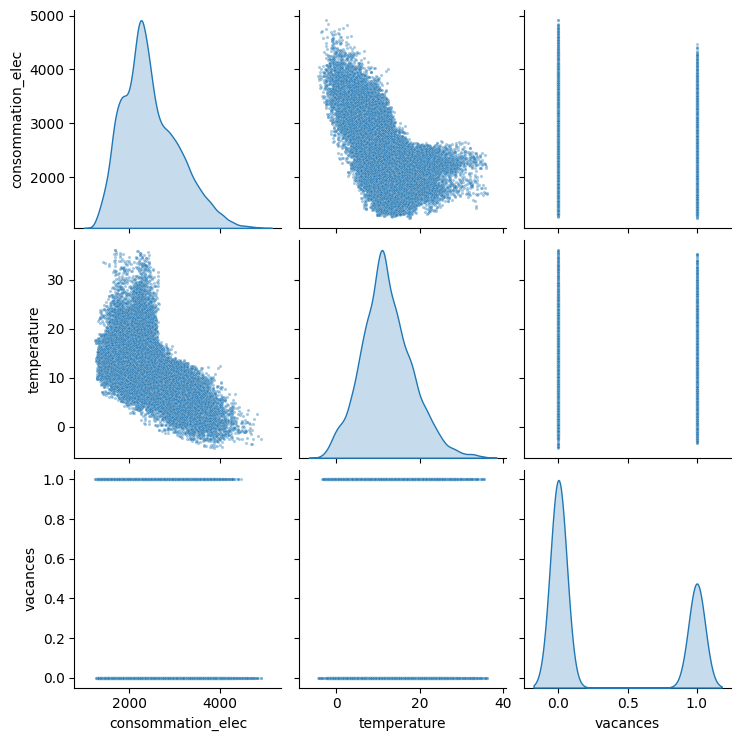

In [6]:
# Compute pairwise correlation plots
import seaborn as sns
import matplotlib.pyplot as plt

sns.pairplot(donnees_completes, kind="scatter", diag_kind="kde",plot_kws={
        "alpha": 0.4,
        "s": 5
    })
plt.show()

Il s'agit de densités sur la diagonale. Les modalités discrêtes sont lissées, alors qu'en réalité elles sont discrètes.

On vérifie que la grille temporelle est régulière et complète (aucun pas de temps manquant).

In [7]:
print(donnees_completes.index.is_unique)

True


Les autocorrelogrammes et autocorrelogrammes partiels sont les suivants :

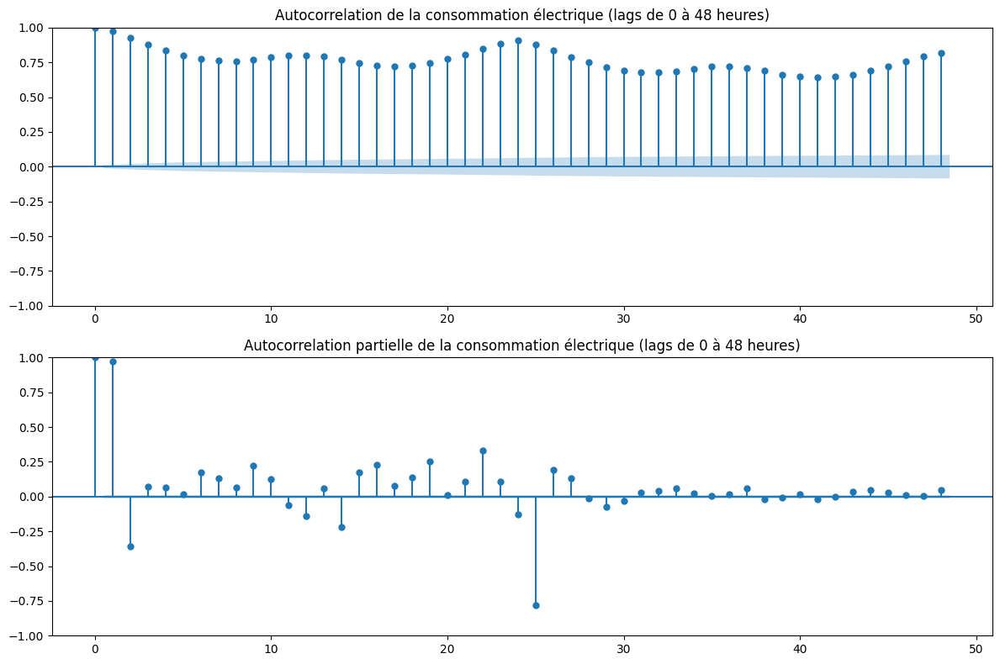

In [8]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf   
fig, axes = plt.subplots(2, 1, figsize=(12, 8))
plot_acf(donnees_completes["consommation_elec"].dropna(), lags=48, ax=axes[0])
plot_pacf(donnees_completes["consommation_elec"].dropna(), lags=48, ax=axes[1])
axes[0].set_title("Autocorrelation de la consommation électrique (lags de 0 à 48 heures)")
axes[1].set_title("Autocorrelation partielle de la consommation électrique (lags de 0 à 48 heures)")
plt.tight_layout()
plt.show()

### Préparation des variables des modèles de prévision

In [9]:
from pandas import Timedelta

from preparation_donnees_sources import ajouter_indicateurs_temporels

# Copy data to avoid touching the original dataframe and make sure it is sorted by date (index)
ml_dataset = donnees_completes.copy().sort_index()

#   * `consommation_elec_h_minus_48` : la consommation électrique à l'heure précédente (H-48). On controle la date de la consommation à H-48.
ml_dataset["consommation_elec_h_minus_48"] = ml_dataset["consommation_elec"].shift(48)      # Cela décale vers le bas les heures (ordonnées de la plus récente à la plus ancienne)
ml_dataset["datetime"] = ml_dataset.index
ml_dataset["datetime_minus_48h"] = ml_dataset.index + Timedelta(hours=-48)

#   * `consommation_elec_mean_week` : la consommation électrique moyenne de la semaine précédente disponible au moment de la prévision (J-8 à J-2, soit H-192 à H-48).
# On se base sur la consommation électrique à H-48 pour calculer la moyenne de la semaine précédente, afin de ne pas introduire de fuite de données. et on applique une moyenne glissante sur 7 jours (7*48 = 336 heures) pour calculer la consommation électrique moyenne de la semaine précédente.
ml_dataset["consommation_elec_mean_week"] = ml_dataset["consommation_elec_h_minus_48"].rolling(window=24*7).mean()

# Ajout des variables temporelles (heure de la journée, jour de la semaine, jour de l'année)
ml_dataset = ajouter_indicateurs_temporels(ml_dataset)

# Séparation du dataset en un dataset d'entraînement (train) et un dataset de test (test) : 4 mois de données les plus récentes pour le test, le reste pour l'entraînement
debut_test = ml_dataset.index.max() - Timedelta(days=30 * 4)
colonnes_a_supprimer = ["datetime", "datetime_minus_48h"]
# Tout l'échantillon sauf les 4 derniers mois pour l'entraînement (train)
train_data = ml_dataset[ml_dataset.index < debut_test].drop(columns=colonnes_a_supprimer)
# Les 4 derniers mois pour le test (test) si la consommation électrique est non manquantes, sinon pour la prévision (forecast)
test_data = ml_dataset[(ml_dataset.index >= debut_test) & (ml_dataset["consommation_elec"].notna())].drop(columns=colonnes_a_supprimer)
# 48 dernières heures pour la prévision (forecast), avec la consommation électrique est manquante
forecast_data = ml_dataset[(ml_dataset.index >= debut_test) & (ml_dataset["consommation_elec"].isna())].drop(columns=colonnes_a_supprimer)

# Spéparation en trois datasets : X_train, y_train, X_test, y_test et 
y_var = "consommation_elec"
X_train = train_data.drop(columns=[y_var])
y_train = train_data[y_var]
X_test = test_data.drop(columns=[y_var])
y_test = test_data[y_var]
X_forecast = forecast_data.drop(columns=[y_var])

### Construction d'un modèle de benchmark simple
Ici nous proposons simplement de prendre la consommation à H-48 comme prévision à H+48. C'est un modèle de benchmark très simple, mais qui peut être difficile à battre pour des prévisions à court terme de séries temporelles avec une forte autocorrelation.
Il fonctionne bien car la consommation d'électricité est très sensible au moment de l'année (chauffage en hiver) et au moment du jour (pics au petit-déjeuner et autour du dîner).

Evaluons la performance de ce modèle de benchmark simple à l'aide d'une métrique d'erreur - ici une MAE (Mean Absolute Error, mesure symétrique et qui pénalise également les erreurs positives et négatives) - sur le dataset de test.

In [10]:
print(f"MAE sur benchmark simple : {(test_data['consommation_elec'] - test_data['consommation_elec_h_minus_48']).abs().mean():.2f} MWh en regard de la consommation moyenne de {test_data['consommation_elec'].mean():.2f} MWh")


MAE sur benchmark simple : 265.76 MWh en regard de la consommation moyenne de 2229.86 MWh


Nous testons des propriétés de stationnarité des résidus du modèle simple (différence entre les valeurs prédites et les valeurs réelles) : les résidus du modèle simple ont-ils une moyenne stable et une absence de dérive significative dans le temps ? On peut utiliser un test de stationnarité comme le test d'Augmented Dickey-Fuller (ADF) pour vérifier cela.

In [11]:
from statsmodels.tsa.stattools import adfuller
from pprint import pprint

res = adfuller((y_test - X_test["consommation_elec_h_minus_48"]).values)

print(
    f"ADF statistic: {res[0]:.4f}\n"
    f"p-value: {res[1]:.3e}\n"
    f"used lags: {res[2]}\n"
    f"nobs: {res[3]}\n"
    f"icbest: {res[5]:.4f}"
)
print("critical values:")
for level, value in res[4].items():
    print(f"  {level}: {value:.4f}")

ADF statistic: -7.3094
p-value: 1.276e-10
used lags: 25
nobs: 2807
icbest: 33213.3498
critical values:
  1%: -3.4327
  5%: -2.8626
  10%: -2.5673


La lecture du test indique avec la p-value de faible valeur qu'on a suffisamment d’évidence statistique contre l’hypothèse H_0.

La série n'a probablement pas de racine unitaire, ce qui suggère que les résidus du modèle simple sont stationnaires. Cela signifie que les résidus ont une moyenne stable et une absence de dérive significative dans le temps. Aussi un modèle plus précis (autres facteurs exogènes et meilleurs algorithmes), les nouveaux résidus hériteront des mêmes propriétés de stationnarité (conditionnelle aux regresseurs), ce qui est une bonne chose pour la prévision.

### Création de la validation croisée

* Validation croisée agnostique à la dimension temporelle (KFold)

In [12]:
import plotly.graph_objects as go
from sklearn.model_selection import KFold


# Shuffled 4-fold CV
kf = KFold(
    n_splits=3,
    shuffle=True,
    random_state=0
)

# Application sur l'échantillon d'entraînement
folds = list(kf.split(train_data.reset_index()))

# Visualisation des date de train et test des folds
fig = go.Figure()
for i, (train_index, test_index) in enumerate(folds):
    fig.add_trace(go.Scattergl(
        x=train_data.index[train_index],
        y=[i + 1] * len(train_index),
        mode='markers',
        name=f'Fold {i+1} - Train',
        marker=dict(color='blue', size=5, symbol='circle')
    ))
    fig.add_trace(go.Scattergl(
        x=train_data.index[test_index],
        y=[i + 1] * len(test_index),
        mode='markers',
        name=f'Fold {i+1} - Validation',
        marker=dict(color='red', size=5, symbol='diamond')
    ))

# Layout
fig.update_layout(
    title="Shuffled KFold on Time Series",
    xaxis_title="Date",
    yaxis=dict(
        title="Numéro du Fold",
        zeroline=False
    ),
    height=600,
    width=1000
)

fig.update_xaxes(
    rangeselector=dict(
        buttons=[
            dict(step="all"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
        ]
    ),
    type="date",
    range=[train_data.index[train_index].max() - Timedelta(days=14), train_data.index[train_index].max() + Timedelta(days=2)]
)

fig.show()


Ci-dessus , on observe que les données de train et de test sont mélangées dans le temps. Cela nie la non-échangeabilité des données temporelles, c'est à dire que les données ne sont pas indépendantes dans le temps et identiquement distribuées (i.i.d.) dans le temps.

En mélangeant les données de train et de test dans le temps, des points dans les données d'apprentissages vont être consécutifs à des points de validation. Les dynamiques des points du `train` vont artificiellement influencer des points de validation. Dans l'usage en prévision, l'échantillon de points à prévoir ne sera pas entourés de points de l'apprentissage. Il y a dans ce schéma des cross-validation des fuites des données (data leakage) où des informations du futur (par rapport à l'échantillon de validation) sont utilisées pour entraîner le modèle, ce qui conduit à l'apprentissage d'un modèle inadapté par rapport aux conditions réelles de prévision. Aussi cela génère une évaluation trop optimiste des performances du modèle sur le dataset de test.


In [13]:
import plotly.graph_objects as go
from sklearn.model_selection import TimeSeriesSplit


# TimeSeriesSplit 3-fold CV
timeseriesplit = TimeSeriesSplit(
    n_splits=3,
)

# Application sur l'échantillon d'entraînement
folds = list(timeseriesplit.split(train_data.reset_index()))

# Visualisation des date de train et test des folds
fig = go.Figure()
for i, (train_index, test_index) in enumerate(folds):
    fig.add_trace(go.Scattergl(
        x=train_data.index[train_index],
        y=[i + 1] * len(train_index),
        mode='markers',
        name=f'Fold {i+1} - Train',
        marker=dict(color='blue', size=3)
    ))
    fig.add_trace(go.Scattergl(
        x=train_data.index[test_index],
        y=[i + 1] * len(test_index),
        mode='markers',
        name=f'Fold {i+1} - Validation',
        marker=dict(color='red', size=3)
    ))

# Layout
fig.update_layout(
    title="TimeSeriesSplit on Time Series",
    xaxis_title="Date",
    yaxis=dict(
        title="Numéro du Fold",
        zeroline=False
    ),
    height=600,
    width=1000
)

fig.show()

### Définition du modèle et choix des hyperparamètres

Nous construisons ici un modèle : 
* de regression (car la variable à prévoir est continue) avec un gradient boosting (`lightgbm`),
* comme il s'agit d'arbres de décision, les données manquantes ne posent pas de problème pour l'apprentissage du modèle, il n'est pas nécessaire de les imputer ou de les supprimer,
* les hyperparamètres optimisés sont : 
  * `n_estimators` : taille de la séquence d'arbres du modèle de gradient boosting,
  * `learning_rate` : le taux d'apprentissage du modèle de gradient boosting, qui contrôle la contribution de chaque arbre à la séquence d'arbres,
  * `max_depth` : la profondeur maximale des arbres de décision dans le modèle de gradient boosting, qui contrôle la complexité des arbres et peut aider à prévenir le surapprentissage,
  * `num_leaves` : le nombre maximum de feuilles dans les arbres de décision du modèle de gradient boosting, qui contrôle la complexité des arbres et peut aider à prévenir le surapprentissage.

Avec 4 hyperpametres, 4 pas pour chaque et 3 folds, cela fait $4^4 * 3 = 768$ modèles à entraîner si un `GridSearchCV` était utilisé, ce qui est déjà assez coûteux en temps de calcul. On utilise ici une recherche aléatoire (`RandomizedSearchCV`) avec 30 ensembles testés.

In [14]:
from lightgbm import LGBMRegressor
from sklearn.model_selection import RandomizedSearchCV

# Définition du regresseur
model = LGBMRegressor(random_state=0, verbose=-1, force_col_wise=True)
grid = {
    "n_estimators": [100, 300, 600, 1000],
    "learning_rate": [0.01, 0.03, 0.05],
    "num_leaves": [5, 15, 31, 63],
    "max_depth": [-1, 6, 15, 30],
}

# Recherche d'hyperparamètres avec RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=model,
    param_distributions=grid,
    scoring="neg_mean_absolute_error",
    cv=timeseriesplit,
    n_jobs=-1,
    verbose=2,
    n_iter=30,  # Number of parameter settings that are sampled
    random_state=0
)

# Lancement de la recherche d'hyperparamètres et tuning du meilleur modèle sur l'échantillon d'entraînement complet
random_search.fit(X_train, y_train)

Fitting 3 folds for each of 30 candidates, totalling 90 fits
[CV] END learning_rate=0.03, max_depth=15, n_estimators=100, num_leaves=15; total time=   0.9s
[CV] END learning_rate=0.03, max_depth=15, n_estimators=100, num_leaves=15; total time=   2.0s
[CV] END learning_rate=0.03, max_depth=15, n_estimators=100, num_leaves=15; total time=   1.7s
[CV] END learning_rate=0.05, max_depth=15, n_estimators=100, num_leaves=63; total time=   4.4s
[CV] END learning_rate=0.05, max_depth=15, n_estimators=100, num_leaves=63; total time=   5.0s
[CV] END learning_rate=0.05, max_depth=15, n_estimators=100, num_leaves=63; total time=   4.3s
[CV] END learning_rate=0.03, max_depth=-1, n_estimators=600, num_leaves=31; total time=  11.1s
[CV] END learning_rate=0.03, max_depth=-1, n_estimators=600, num_leaves=31; total time=  11.9s
[CV] END learning_rate=0.03, max_depth=-1, n_estimators=600, num_leaves=31; total time=  12.8s
[CV] END learning_rate=0.01, max_depth=6, n_estimators=100, num_leaves=31; total tim

,"estimator estimator: estimator objectAn object of that type is instantiated for each grid point.This is assumed to implement the scikit-learn estimator interface.Either estimator needs to provide a ``score`` function,or ``scoring`` must be passed.","LGBMRegressor...0, verbose=-1)"
,"param_distributions param_distributions: dict or list of dictsDictionary with parameters names (`str`) as keys and distributionsor lists of parameters to try. Distributions must provide a ``rvs``method for sampling (such as those from scipy.stats.distributions).If a list is given, it is sampled uniformly.If a list of dicts is given, first a dict is sampled uniformly, andthen a parameter is sampled using that dict as above.","{'learning_rate': [0.01, 0.03, ...], 'max_depth': [-1, 6, ...], 'n_estimators': [100, 300, ...], 'num_leaves': [5, 15, ...]}"
,"n_iter n_iter: int, default=10Number of parameter settings that are sampled. n_iter tradesoff runtime vs quality of the solution.",30
,"scoring scoring: str, callable, list, tuple or dict, default=NoneStrategy to evaluate the performance of the cross-validated model onthe test set.If `scoring` represents a single score, one can use:- a single string (see :ref:`scoring_string_names`);- a callable (see :ref:`scoring_callable`) that returns a single value;- `None`, the `estimator`'s :ref:`default evaluation criterion ` is used.If `scoring` represents multiple scores, one can use:- a list or tuple of unique strings;- a callable returning a dictionary where the keys are the metric names and the values are the metric scores;- a dictionary with metric names as keys and callables as values.See :ref:`multimetric_grid_search` for an example.If None, the estimator's score method is used.",'neg_mean_absolute_error'
,"n_jobs n_jobs: int, default=NoneNumber of jobs to run in parallel.``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.``-1`` means using all processors. See :term:`Glossary `for more details... versionchanged:: v0.20 `n_jobs` default changed from 1 to None",-1
,"refit refit: bool, str, or callable, default=TrueRefit an estimator using the best found parameters on the wholedataset.For multiple metric evaluation, this needs to be a `str` denoting thescorer that would be used to find the best parameters for refittingthe estimator at the end.Where there are considerations other than maximum score inchoosing a best estimator, ``refit`` can be set to a function whichreturns the selected ``best_index_`` given the ``cv_results_``. In thatcase, the ``best_estimator_`` and ``best_params_`` will be setaccording to the returned ``best_index_`` while the ``best_score_``attribute will not be available.The refitted estimator is made available at the ``best_estimator_``attribute and permits using ``predict`` directly on this``RandomizedSearchCV`` instance.Also for multiple metric evaluation, the attributes ``best_index_``,``best_score_`` and ``best_params_`` will only be available if``refit`` is set and all of them will be determined w.r.t this specificscorer.See ``scoring`` parameter to know more about multiple metricevaluation.See :ref:`this example`for an example of how to use ``refit=callable`` to balance modelcomplexity and cross-validated score... versionchanged:: 0.20 Support for callable added.",True
,"cv cv: int, cross-validation generator or an iterable, default=NoneDetermines the cross-validation splitting strategy.Possible inputs for cv are:- None, to use the default 5-fold cross validation,- integer, to specify the number of folds in a `(Stratified)KFold`,- :term:`CV splitter`,- An iterable yielding (train, test) splits as arrays of indices.For integer/None inputs, if the estimator is a classifier and ``y`` iseither binary or multiclass, :class:`StratifiedKFold` is used. In allother cases, :class:`KFold` is used. These splitters are instantiatedwith `shuffle=False` so the splits will be the same across calls.Refer :ref:`User Guide ` for the variouscross-validation strategies that can be

En complément, nous proposons une méthode de recherche d'hyperparamètres plus efficace, adoptant une approche bayésienne. Cette méthode est notemment implémentée dans la bibliothèque `optuna`.
Prenons le même nombre d'ensemble de paramètres testés (30) que pour la recherche aléatoire, mais avec une approche bayésienne, on peut espérer trouver des hyperparamètres plus performants que la recherche aléatoire, car elle utilise les résultats des essais précédents pour orienter la recherche vers des régions de l'espace d'hyperparamètres plus prometteuses.

In [15]:
from optuna import create_study
from sklearn.model_selection import cross_val_score

# init d'une recherche
study = create_study(direction="minimize")
# Define hyperparameters to tune
def objective(trial):

    # Axes des HP à tester, plages de valeurs et échelle de recherche (linéaire ou logarithmique)
    iterations = trial.suggest_int("n_estimators", 60, 400, log=True)
    learning_rate = trial.suggest_float("learning_rate", 0.02, 0.2, log=True)
    num_leaves = trial.suggest_int("num_leaves", 5, 63, log=True)
    max_depth = trial.suggest_int("max_depth", 5, 100, log=True)

    l2_leaf_reg = trial.suggest_int("l2_leaf_reg", 1, 20, log=True)

    # Prepare the regressor with the parameters suggested by the trial
    reg = LGBMRegressor(
        n_estimators=iterations,
        max_depth=max_depth,
        num_leaves=num_leaves,
        learning_rate=learning_rate,
        reg_lambda=l2_leaf_reg,
        random_state=0,
        verbose=-1,
        force_col_wise=True,
        loss_function="mae"

    )

    # Evaluate the regressor using cross-validation and return the mean score
    cv_score = cross_val_score(
        reg,
        X_train,
        y_train,
        cv=timeseriesplit,
        scoring="neg_mean_absolute_error",
        n_jobs=-1,
    ).mean()

    return -cv_score

# Launch the optimization
study.optimize(objective, n_trials=30, show_progress_bar=True)

# Train on the best hyperparameters found on the full training set
best_params = study.best_params
optuna_search = LGBMRegressor(
    n_estimators=best_params["n_estimators"],
    max_depth=best_params["max_depth"],
    num_leaves=best_params["num_leaves"],
    learning_rate=best_params["learning_rate"],
    reg_lambda=best_params["l2_leaf_reg"],
    random_state=0,
    verbose=-1,
    force_col_wise=True,
    loss_function="mae"
)

# Apprentissage sur le dataset d'entraînement complet avec les meilleurs hyperparamètres trouvés
optuna_search.fit(X_train, y_train)

/home/julien-gooris/Projects/teaching/2026-06-03 UBS - Sciences des données/TP/.venv/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
[I 2026-06-03 22:32:55,658] A new study created in memory with name: no-name-71ea4558-289e-4f9f-be27-cfcc753fcd6b
Best trial: 0. Best value: 168.294:   3%|▎         | 1/30 [00:00<00:17,  1.70it/s]

[I 2026-06-03 22:32:56,248] Trial 0 finished with value: 168.29355324797527 and parameters: {'n_estimators': 82, 'learning_rate': 0.04339745348149091, 'num_leaves': 44, 'max_depth': 7, 'l2_leaf_reg': 1}. Best is trial 0 with value: 168.29355324797527.


Best trial: 1. Best value: 163.631:   7%|▋         | 2/30 [00:01<00:23,  1.22it/s]

[I 2026-06-03 22:32:57,231] Trial 1 finished with value: 163.63055182757424 and parameters: {'n_estimators': 221, 'learning_rate': 0.05091490591891496, 'num_leaves': 26, 'max_depth': 72, 'l2_leaf_reg': 14}. Best is trial 1 with value: 163.63055182757424.


Best trial: 1. Best value: 163.631:  10%|█         | 3/30 [00:01<00:16,  1.64it/s]

[I 2026-06-03 22:32:57,589] Trial 2 finished with value: 170.39366340121197 and parameters: {'n_estimators': 109, 'learning_rate': 0.1442413687699328, 'num_leaves': 17, 'max_depth': 30, 'l2_leaf_reg': 2}. Best is trial 1 with value: 163.63055182757424.


Best trial: 1. Best value: 163.631:  13%|█▎        | 4/30 [00:03<00:22,  1.18it/s]

[I 2026-06-03 22:32:58,799] Trial 3 finished with value: 164.73441188560125 and parameters: {'n_estimators': 180, 'learning_rate': 0.06102457536832016, 'num_leaves': 40, 'max_depth': 27, 'l2_leaf_reg': 12}. Best is trial 1 with value: 163.63055182757424.


Best trial: 4. Best value: 162.849:  17%|█▋        | 5/30 [00:03<00:19,  1.28it/s]

[I 2026-06-03 22:32:59,463] Trial 4 finished with value: 162.8490743995669 and parameters: {'n_estimators': 121, 'learning_rate': 0.07291618191089475, 'num_leaves': 17, 'max_depth': 41, 'l2_leaf_reg': 1}. Best is trial 4 with value: 162.8490743995669.


Best trial: 4. Best value: 162.849:  20%|██        | 6/30 [00:05<00:29,  1.23s/it]

[I 2026-06-03 22:33:01,570] Trial 5 finished with value: 169.73716329131395 and parameters: {'n_estimators': 244, 'learning_rate': 0.10199782305049547, 'num_leaves': 52, 'max_depth': 37, 'l2_leaf_reg': 1}. Best is trial 4 with value: 162.8490743995669.


Best trial: 4. Best value: 162.849:  23%|██▎       | 7/30 [00:06<00:24,  1.06s/it]

[I 2026-06-03 22:33:02,265] Trial 6 finished with value: 169.96906173119987 and parameters: {'n_estimators': 75, 'learning_rate': 0.09696769354742964, 'num_leaves': 50, 'max_depth': 32, 'l2_leaf_reg': 1}. Best is trial 4 with value: 162.8490743995669.


Best trial: 4. Best value: 162.849:  27%|██▋       | 8/30 [00:07<00:20,  1.09it/s]

[I 2026-06-03 22:33:02,884] Trial 7 finished with value: 187.5305334083973 and parameters: {'n_estimators': 82, 'learning_rate': 0.02595442411445255, 'num_leaves': 41, 'max_depth': 32, 'l2_leaf_reg': 2}. Best is trial 4 with value: 162.8490743995669.


Best trial: 4. Best value: 162.849:  30%|███       | 9/30 [00:07<00:16,  1.28it/s]

[I 2026-06-03 22:33:03,373] Trial 8 finished with value: 165.9405356601517 and parameters: {'n_estimators': 115, 'learning_rate': 0.04083969004572915, 'num_leaves': 21, 'max_depth': 10, 'l2_leaf_reg': 3}. Best is trial 4 with value: 162.8490743995669.


Best trial: 4. Best value: 162.849:  33%|███▎      | 10/30 [00:08<00:13,  1.44it/s]

[I 2026-06-03 22:33:03,864] Trial 9 finished with value: 167.80348319146978 and parameters: {'n_estimators': 151, 'learning_rate': 0.09740148080165958, 'num_leaves': 17, 'max_depth': 23, 'l2_leaf_reg': 6}. Best is trial 4 with value: 162.8490743995669.


Best trial: 4. Best value: 162.849:  37%|███▋      | 11/30 [00:08<00:12,  1.56it/s]

[I 2026-06-03 22:33:04,386] Trial 10 finished with value: 178.26720696123382 and parameters: {'n_estimators': 368, 'learning_rate': 0.19410178296647168, 'num_leaves': 7, 'max_depth': 97, 'l2_leaf_reg': 5}. Best is trial 4 with value: 162.8490743995669.


Best trial: 4. Best value: 162.849:  40%|████      | 12/30 [00:09<00:09,  1.83it/s]

[I 2026-06-03 22:33:04,720] Trial 11 finished with value: 163.8759944486049 and parameters: {'n_estimators': 244, 'learning_rate': 0.06315117847332666, 'num_leaves': 6, 'max_depth': 85, 'l2_leaf_reg': 19}. Best is trial 4 with value: 162.8490743995669.


Best trial: 4. Best value: 162.849:  43%|████▎     | 13/30 [00:09<00:10,  1.55it/s]

[I 2026-06-03 22:33:05,587] Trial 12 finished with value: 163.01974491404093 and parameters: {'n_estimators': 181, 'learning_rate': 0.03865807087068029, 'num_leaves': 25, 'max_depth': 62, 'l2_leaf_reg': 8}. Best is trial 4 with value: 162.8490743995669.


Best trial: 4. Best value: 162.849:  47%|████▋     | 14/30 [00:10<00:08,  1.83it/s]

[I 2026-06-03 22:33:05,907] Trial 13 finished with value: 173.24045096124198 and parameters: {'n_estimators': 129, 'learning_rate': 0.027825699133429152, 'num_leaves': 11, 'max_depth': 50, 'l2_leaf_reg': 7}. Best is trial 4 with value: 162.8490743995669.


Best trial: 4. Best value: 162.849:  50%|█████     | 15/30 [00:11<00:09,  1.64it/s]

[I 2026-06-03 22:33:06,664] Trial 14 finished with value: 163.58984896248398 and parameters: {'n_estimators': 346, 'learning_rate': 0.03494412578765675, 'num_leaves': 11, 'max_depth': 14, 'l2_leaf_reg': 2}. Best is trial 4 with value: 162.8490743995669.


Best trial: 4. Best value: 162.849:  57%|█████▋    | 17/30 [00:12<00:07,  1.83it/s]

[I 2026-06-03 22:33:07,593] Trial 15 finished with value: 164.5857386261863 and parameters: {'n_estimators': 179, 'learning_rate': 0.08429842155972532, 'num_leaves': 29, 'max_depth': 51, 'l2_leaf_reg': 10}. Best is trial 4 with value: 162.8490743995669.
[I 2026-06-03 22:33:07,765] Trial 16 finished with value: 246.65449424458893 and parameters: {'n_estimators': 63, 'learning_rate': 0.021804456922754605, 'num_leaves': 11, 'max_depth': 54, 'l2_leaf_reg': 4}. Best is trial 4 with value: 162.8490743995669.


Best trial: 4. Best value: 162.849:  60%|██████    | 18/30 [00:12<00:06,  1.82it/s]

[I 2026-06-03 22:33:08,323] Trial 17 finished with value: 166.64953332041605 and parameters: {'n_estimators': 102, 'learning_rate': 0.07951511453187605, 'num_leaves': 30, 'max_depth': 17, 'l2_leaf_reg': 1}. Best is trial 4 with value: 162.8490743995669.


Best trial: 4. Best value: 162.849:  63%|██████▎   | 19/30 [00:13<00:05,  1.98it/s]

[I 2026-06-03 22:33:08,727] Trial 18 finished with value: 165.73915121900782 and parameters: {'n_estimators': 147, 'learning_rate': 0.03157662266951609, 'num_leaves': 13, 'max_depth': 64, 'l2_leaf_reg': 8}. Best is trial 4 with value: 162.8490743995669.


Best trial: 4. Best value: 162.849:  67%|██████▋   | 20/30 [00:15<00:10,  1.01s/it]

[I 2026-06-03 22:33:10,916] Trial 19 finished with value: 165.98213071388702 and parameters: {'n_estimators': 205, 'learning_rate': 0.052750332577341984, 'num_leaves': 63, 'max_depth': 42, 'l2_leaf_reg': 3}. Best is trial 4 with value: 162.8490743995669.


Best trial: 4. Best value: 162.849:  70%|███████   | 21/30 [00:15<00:07,  1.20it/s]

[I 2026-06-03 22:33:11,330] Trial 20 finished with value: 168.9292836738682 and parameters: {'n_estimators': 95, 'learning_rate': 0.1388430252862828, 'num_leaves': 23, 'max_depth': 18, 'l2_leaf_reg': 1}. Best is trial 4 with value: 162.8490743995669.


Best trial: 4. Best value: 162.849:  73%|███████▎  | 22/30 [00:16<00:06,  1.28it/s]

[I 2026-06-03 22:33:11,985] Trial 21 finished with value: 167.22000284137334 and parameters: {'n_estimators': 395, 'learning_rate': 0.03630872759750346, 'num_leaves': 8, 'max_depth': 12, 'l2_leaf_reg': 2}. Best is trial 4 with value: 162.8490743995669.


Best trial: 22. Best value: 159.867:  77%|███████▋  | 23/30 [00:17<00:05,  1.27it/s]

[I 2026-06-03 22:33:12,801] Trial 22 finished with value: 159.86705677690944 and parameters: {'n_estimators': 300, 'learning_rate': 0.034681849483773376, 'num_leaves': 14, 'max_depth': 13, 'l2_leaf_reg': 1}. Best is trial 22 with value: 159.86705677690944.


Best trial: 22. Best value: 159.867:  80%|████████  | 24/30 [00:17<00:04,  1.24it/s]

[I 2026-06-03 22:33:13,645] Trial 23 finished with value: 163.43425856902192 and parameters: {'n_estimators': 321, 'learning_rate': 0.04682176262770799, 'num_leaves': 14, 'max_depth': 9, 'l2_leaf_reg': 1}. Best is trial 22 with value: 159.86705677690944.


Best trial: 22. Best value: 159.867:  83%|████████▎ | 25/30 [00:18<00:04,  1.17it/s]

[I 2026-06-03 22:33:14,622] Trial 24 finished with value: 165.34937422041324 and parameters: {'n_estimators': 272, 'learning_rate': 0.023590142341854643, 'num_leaves': 20, 'max_depth': 7, 'l2_leaf_reg': 1}. Best is trial 22 with value: 159.86705677690944.


Best trial: 22. Best value: 159.867:  87%|████████▋ | 26/30 [00:19<00:03,  1.11it/s]

[I 2026-06-03 22:33:15,632] Trial 25 finished with value: 172.56931364838147 and parameters: {'n_estimators': 291, 'learning_rate': 0.07053739537001877, 'num_leaves': 34, 'max_depth': 5, 'l2_leaf_reg': 1}. Best is trial 22 with value: 159.86705677690944.


Best trial: 22. Best value: 159.867:  90%|█████████ | 27/30 [00:20<00:02,  1.39it/s]

[I 2026-06-03 22:33:15,915] Trial 26 finished with value: 180.0979276545055 and parameters: {'n_estimators': 131, 'learning_rate': 0.029296752573761898, 'num_leaves': 9, 'max_depth': 22, 'l2_leaf_reg': 2}. Best is trial 22 with value: 159.86705677690944.


Best trial: 22. Best value: 159.867:  93%|█████████▎| 28/30 [00:20<00:01,  1.70it/s]

[I 2026-06-03 22:33:16,208] Trial 27 finished with value: 164.29153846910725 and parameters: {'n_estimators': 188, 'learning_rate': 0.05529692450957623, 'num_leaves': 5, 'max_depth': 41, 'l2_leaf_reg': 4}. Best is trial 22 with value: 159.86705677690944.


Best trial: 28. Best value: 159.635:  97%|█████████▋| 29/30 [00:21<00:00,  1.79it/s]

[I 2026-06-03 22:33:16,693] Trial 28 finished with value: 159.63503309726323 and parameters: {'n_estimators': 168, 'learning_rate': 0.038570503112549594, 'num_leaves': 14, 'max_depth': 70, 'l2_leaf_reg': 1}. Best is trial 28 with value: 159.63503309726323.


Best trial: 28. Best value: 159.635: 100%|██████████| 30/30 [00:21<00:00,  1.41it/s]


[I 2026-06-03 22:33:16,996] Trial 29 finished with value: 165.36415205480927 and parameters: {'n_estimators': 93, 'learning_rate': 0.04584355559276231, 'num_leaves': 15, 'max_depth': 82, 'l2_leaf_reg': 1}. Best is trial 28 with value: 159.63503309726323.


,boosting_type,'gbdt'
,num_leaves,14
,max_depth,70
,learning_rate,0.038570503112549594
,n_estimators,168
,subsample_for_bin,200000
,objective,None
,class_weight,None
,min_split_gain,0.0
,min_child_weight,0.001
,min_child_samples,20


### Evaluation du modèle et prévision

On compare les MAE de cross validation de la RandomizedSearchCV et de celle avec Optuna.


In [16]:
# MAE de cross validation de la random search
print("Best CV mean score - Random search:", -random_search.best_score_)
# Avec optuna
print("Best CV mean score - Optuna:", study.best_value)

Best CV mean score - Random search: 162.81247647557723
Best CV mean score - Optuna: 159.63503309726323


Le modèle (ici issu de l'optimisation bayésienne avec Optuna) utilisant le gradient boosting peut être testé sur les 4 derniers mois de données. Sa MAE est la suivante :

In [17]:
from sklearn.metrics import mean_absolute_error

print(f"MAE du modèle : {mean_absolute_error(y_test, optuna_search.predict(X_test)):.2f} MWh")

MAE du modèle : 143.75 MWh


A comparer avec la MAE du modèle de benchmark simple ! Les variables exogènes et le gradient boosting permettent d'améliorer les performances de prévision à H+48 par rapport au modèle de benchmark simple qui utilise uniquement la consommation à H-48.

Maintenant prévoyons la consommation électrique à H+48 pour les prochaines heures (jusqu'à H+48) et visualisons nos prévisions.

In [18]:
X_train
# forecast_data["consommation_elec_prevue"] = search.predict(X_forecast)

,temperature,vacances,consommation_elec_h_minus_48,consommation_elec_mean_week,minute_in_day,day_of_week,day_of_year
datetime,,,,,,,
2023-01-01 00:00:00+01:00,11.1,True,NaN,NaN,0,6,1
2023-01-01 01:00:00+01:00,10.8,True,NaN,NaN,60,6,1
2023-01-01 02:00:00+01:00,10.6,True,NaN,NaN,120,6,1
2023-01-01 03:00:00+01:00,10.6,True,NaN,NaN,180,6,1
2023-01-01 04:00:00+01:00,10.5,True,NaN,NaN,240,6,1
...,...,...,...,...,...,...,...
2026-02-05 16:00:00+01:00,10.6,False,2562.0,3132.184524,960,3,36
2026-02-05 17:00:00+01:00,10.8,False,2625.0,3128.267857,1020,3,36
2026-02-05 18:00:00+01:00,10.3,False,2706.0,3124.505952,1080,3,36


In [19]:
# Ajout des prévisions du modèle de gradient boosting sur les datasets de test et de prévision
test_data["consommation_elec_prevue"] = optuna_search.predict(X_test)
forecast_data["consommation_elec_prevue"] = optuna_search.predict(X_forecast)

In [25]:
# Visualisation des prévisions à H+48 pour les prochaines heures
fig = go.Figure()
# Limitons les données réelles sur les 2 dernières semaines pour mieux visualiser les prévisions à H+48
recent_data = test_data.tail(24 * 7)  # 7 derniers jours

# Réel
fig.add_trace(go.Scattergl(
    x=recent_data.index,
    y=recent_data["consommation_elec"],
    mode='markers+lines',
    name="Consommation électrique réelle (MWh)",
    marker=dict(color='blue', size=5),
    line=dict(color='blue', dash='dot')
))
# Prévu sur test_data
fig.add_trace(go.Scattergl(
    x=recent_data.index,
    y=recent_data["consommation_elec_prevue"],
    mode='markers+lines',
    name="Consommation électrique prévue sur test (MWh)",
    marker=dict(color='orange', size=5),
    line=dict(color='orange', dash='dot')
))
# Prévisions à H+48
fig.add_trace(go.Scattergl(
    x=forecast_data.index,
    y=forecast_data["consommation_elec_prevue"],
    mode='markers+lines',
    name="Consommation électrique prévue à H+48 (MWh)",
    marker=dict(color='red', size=5),
    line=dict(color='red', dash='dot')
))      
# Libellés de l'axe X avec jour de semaine en français
jours_fr = {
    0: "Lun", 1: "Mar", 2: "Mer", 3: "Jeu",
    4: "Ven", 5: "Sam", 6: "Dim"
}

# Un tick par jour (à minuit) sur la fenêtre affichée
tick_vals = recent_data.index[recent_data.index.hour == 0].append(
    forecast_data.index[forecast_data.index.hour == 0]
).unique().sort_values()

tick_text = [f"{jours_fr[d.weekday()]} {d.strftime('%d/%m')}" for d in tick_vals]

fig.update_layout(
    title="Prévision de la consommation électrique à H+48",
    xaxis_title="Date",
    yaxis_title="Consommation électrique (MWh)",
    height=600,
    width=1000
)

fig.update_xaxes(
    tickmode="array",
    tickvals=tick_vals,
    ticktext=tick_text,
    # Rotate tick labels for better readability
    tickangle=45
)

fig.update_yaxes(
    rangemode="tozero",   # force l'affichage de 0 dans l'axe Y
    zeroline=True,
)
fig.show()

## Explicabilité du modèle et importance des regresseurs

Des explications du modèle dans sa globalité - global feature importance - et par prédiction - local feature importance - peuvent être obtenues avec la méthode des *Shapley values*. Elle est misen en oeuvre à l'aide, notemment, de la bibliothèque `shap`.

* L'explication globale donne un score d'importance de chaque variable dans le modèle, en moyenne sur l'ensemble des prédictions. On souhaite comprendre le comportement global du modèle appris, donc les données de train sont utilisées pour calculer l'explication globale.

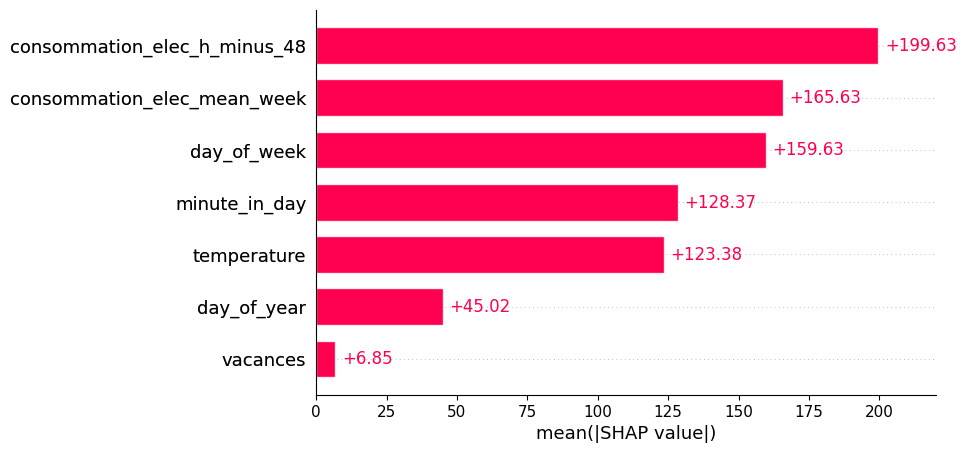

In [21]:
# Prepare the explainer for the best model found by Optuna
from shap import TreeExplainer, plots
explainer = TreeExplainer(optuna_search)

# Global feature importance
shap_values = explainer(X_train)
plots.bar(shap_values, max_display=None)

* L'explication locale donne la contribution estimée de chaque variable à la prédiction pour une observation donnée par rapport à la moyenne. Ici on estime le dernier point à prévoir, dans 48h.

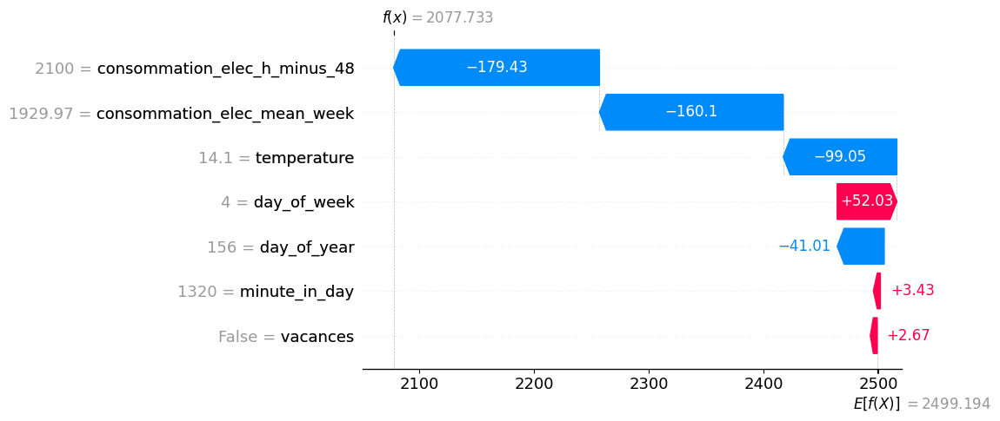

In [22]:
# une observation à expliquer
shap_values = explainer(X_forecast.iloc[[-1]])
plots.waterfall(shap_values[0])

D'une moyenne de 2496 MW, on voit les impacts principaux des régressseurs : moyenne de la dernière semaine, le moment de la journée, la températuure et le jour de l'année.
